In [1]:
import TestImages: testimage
import ImageShow
using FileIO

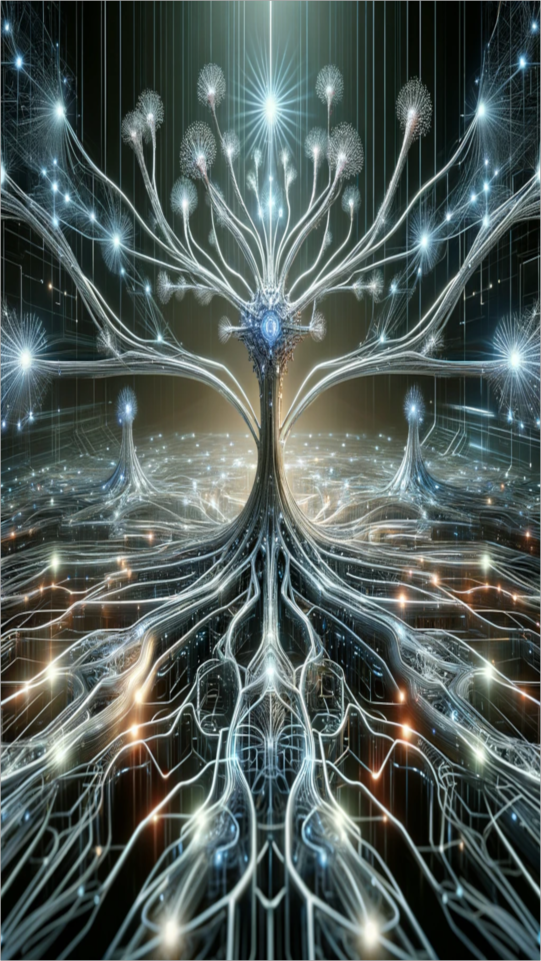

In [2]:
ing = load("tuesday-nocompression.png")

In [3]:
(xsize, ysize) = size(ing)

(1920, 1080)

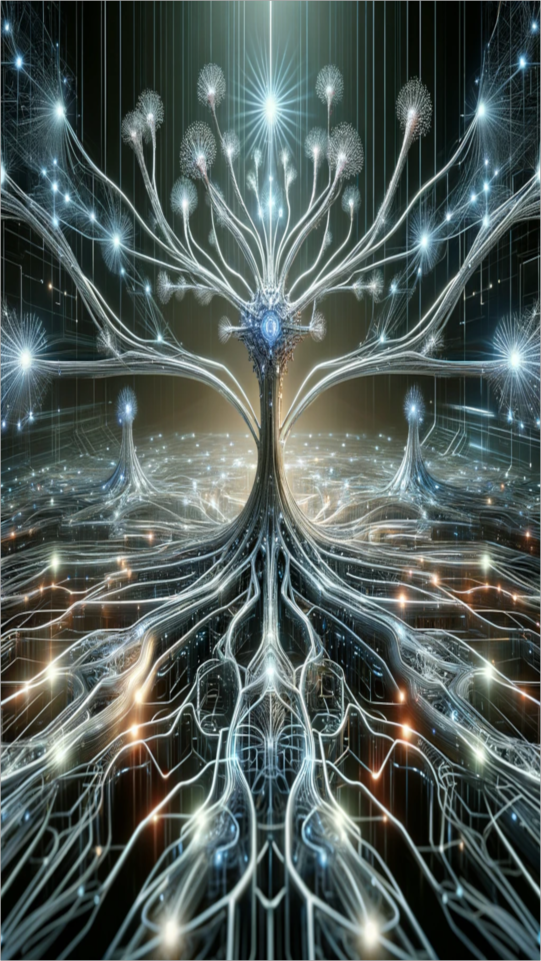

In [4]:
im = 1*ing

In [5]:
using Colors

In [10]:
function light_wave(im, v, max_coef, wave_width, shift)
    (xsize, ysize) = size(im)
    function light_bright(p, y)
        in_wave = (y+shift)%200
        half_wave_width = wave_width/2
        if max(p.r, p.g, p.b) > v && in_wave < wave_width            
            #coef = max_coef*(1f0-abs(in_wave-half_wave_width)/half_wave_width)
            coef = max_coef
            return RGBA{Float32}((1f0-coef)*p.r+coef, (1f0-coef)*p.g+coef, (1f0-coef)*p.b+coef, 1.0f0)
        else
            return p
        end
    end
    [light_bright(im[x,y], x) for x in 1:xsize, y in 1:ysize]
end

light_wave (generic function with 1 method)

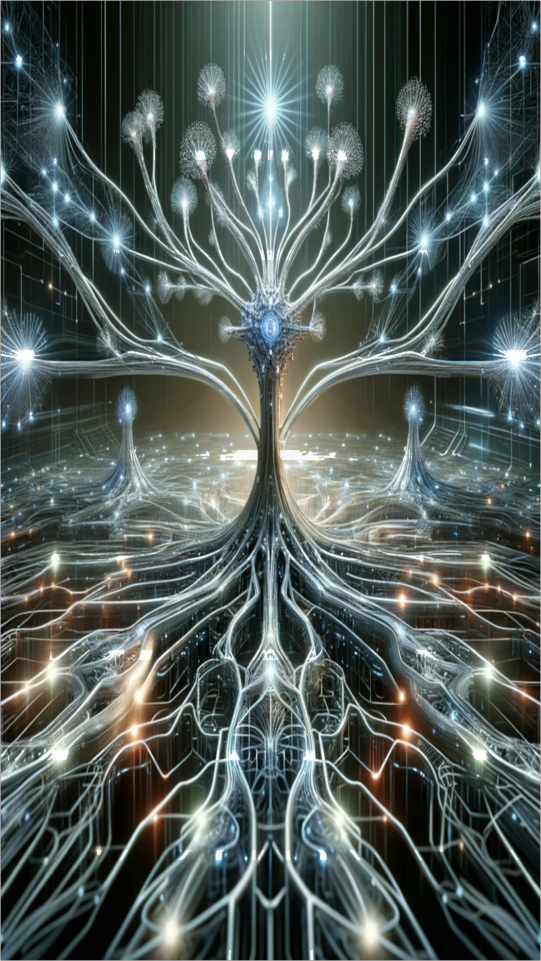

In [11]:
light_wave(im, 0.7f0, 0.9f0, 20, 100)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

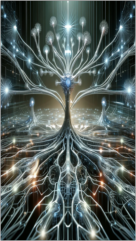
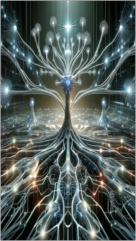
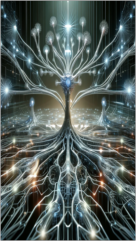
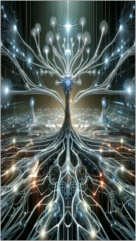
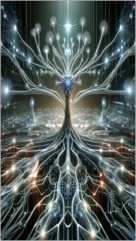
...
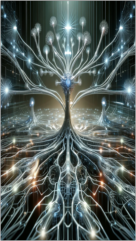
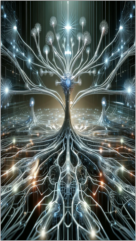
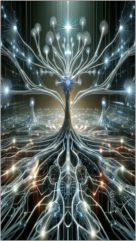
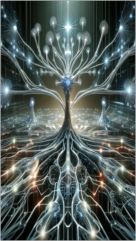
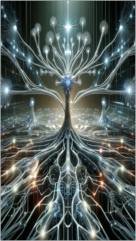

In [12]:
imgs = [light_wave(im, 0.7f0, 0.9f0, 20, shift) for shift in 0:2:199]

In [13]:
save("tuesday-2.gif", cat(imgs..., dims=3), fps=24)

In [14]:
size(imgs)

(100,)

In [16]:
for i in 1:100
    save("t-2/tue-"*string(i)*".png", imgs[i])    
end